<a href="https://colab.research.google.com/github/dakyommii/study/blob/main/LSGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Least Square GAN

### Introduction

Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! [LSGAN](https://arxiv.org/abs/1611.04076) was one of the known version that aimed to improve GAN results by finding more suitable loss function.

### Learning Objectives

- Understand the difference between LSGAN and GAN
- Train LSGAN

### Steps to run this notebook from Colaboratory

This colab will run much faster on GPU. To use a Google Cloud
GPU:

1. Go to `Runtime > Change runtime type`.
1. Click `Hardware accelerator`.
1. Select `GPU` and click `Save`.
1. Click `Connect` in the upper right corner and select `Connect to hosted runtime`.

### Imports (RUN ME!)

Make sure to run the imports cell above, otherwise the rest of the cells will fail when you try to run them. (To run a cell press `shift` + `enter` with your mouse cursor in the cell or press the play button in the top right of the cell.)

    텐서플로우 가져오기

In [1]:
##텐서플로우 가져오기
%load_ext tensorboard

import os
from glob import glob
import time
import random

import IPython.display as display
import matplotlib.pyplot as plt # Matplotlib is used to generate plots of data.
import matplotlib.image as mpimg
import PIL
from PIL import Image
import imageio
import numpy as np # Numpy is an efficient linear algebra library.

import tensorflow as tf
from tensorflow.keras import layers
%matplotlib inline

## Mount Drive

In [2]:
##드라이버에 연결해 입력 데이터를 읽고 모든 결과를 저장할 장소가 있는지 확인하기 위해 디렉토리 설정
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Configs

In [3]:
##하이퍼파라미터에서 경로까지 필요한 젅체 구성 선택
##랜덤 시드도 필수
# Experiment paths
EXPERIMENT_ID = "train_lsGAN"
MODEL_SAVE_PATH = os.path.join("/content/drive/My Drive/lecture hands on lab/LSGAN/results", EXPERIMENT_ID)
if not os.path.exists(MODEL_SAVE_PATH):
    os.makedirs(MODEL_SAVE_PATH)
CHECKPOINT_DIR = os.path.join(MODEL_SAVE_PATH, 'training_checkpoints')


# Data path
DATA_PATH = "/content/drive/My Drive/lecture hands on lab/datasets/cars/cars_images/"


# Model parameters
BATCH_SIZE = 64
EPOCHS = 845
LATENT_DEPTH = 100
IMAGE_SHAPE = [100,100]
NB_CHANNELS = 3
LR = 1e-4

##고정 랜덤 시드는 머신러닝에서 사용되는 일반적은 "트릭"으로 관련된 랜덤 요소가 있을 때 동일한 데이터를 다시 생성 가능
##따라서 이전에 했던 훈련에서 동일한 결과를 생성하려는 경우는 원하는 훈련에 대해 동일한 랜덤 시드를 배치하기만 하면 됨
# A fixed random seed is a common "trick" used in ML that allows us to recreate
# the same data when there is a random element involved.
seed = random.seed(30)

### Data understanding and exploration

It can be challenging to understand both how GANs work and how deep convolutional neural network models can be trained in a GAN architecture for image generation. A good starting point for beginners is to practice developing and using GANs on simple image datasets used in the field of computer vision. Using small and well-understood datasets means that smaller models can be developed and trained quickly, allowing focus to be put on the model architecture and image generation process itself.

We have choosen [cars dataset](https://www.kaggle.com/prondeau/the-car-connection-picture-dataset) from kaggle. It contains a lot of interior and useless images that was filtred to have 8960 diverse images with good quality ready to be used for training.

NB: with great model architecture and too little training data, GANs will overfit and will not easily converge.

이미지를 올바르게 읽고 있는지 확인해 코드 디버깅 시작할 위치 항상 알 수 있도록 해야함

In [4]:
##이미지 번호 세는 것으로 시작해 구성에 정의된 경로의 이미지 표시
image_count = len(list(glob(str( DATA_PATH + '*.jpg'))))
image_count

9091

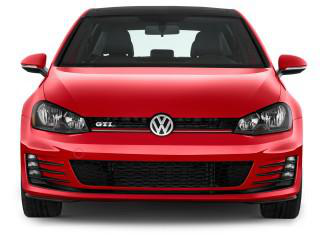

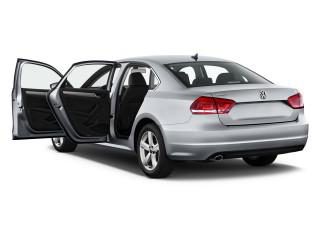

In [5]:
cars_images_path = list(glob(str(DATA_PATH + '*.jpg')))
for image_path in cars_images_path[:2]:
    display.display(Image.open(str(image_path)))

In [6]:
##GAN 학습을 위해 자동차 이미지를 얻어오려고 함
##자동차 이미지는 파일 이름이 자동차 모델로 시작하므로 모델 이름을 분할
images_name = [i.split(DATA_PATH) for i in cars_images_path]
images_name = [x[:][1] for x in images_name]
cars_model = [i.split('_')[0] for i in images_name]

In [7]:
##고유한 모델 이름 포함된 unique_cars 목록 가져오기
def unique(list1): 
    list_set = set(list1) 
    unique_list = (list(list_set)) 
    return unique_list

In [8]:
unique_cars = unique(cars_model)
unique_cars

['Tesla',
 'Rolls-Royce',
 'Aston Martin',
 'Chevrolet',
 'Bentley',
 'Alfa Romeo',
 'Chrysler',
 'Volkswagen',
 'Toyota',
 'Audi',
 'Volvo',
 'Cadillac',
 'Acura',
 'Subaru',
 'Porsche',
 'BMW',
 'smart',
 'Ram',
 'Nissan',
 'Buick']

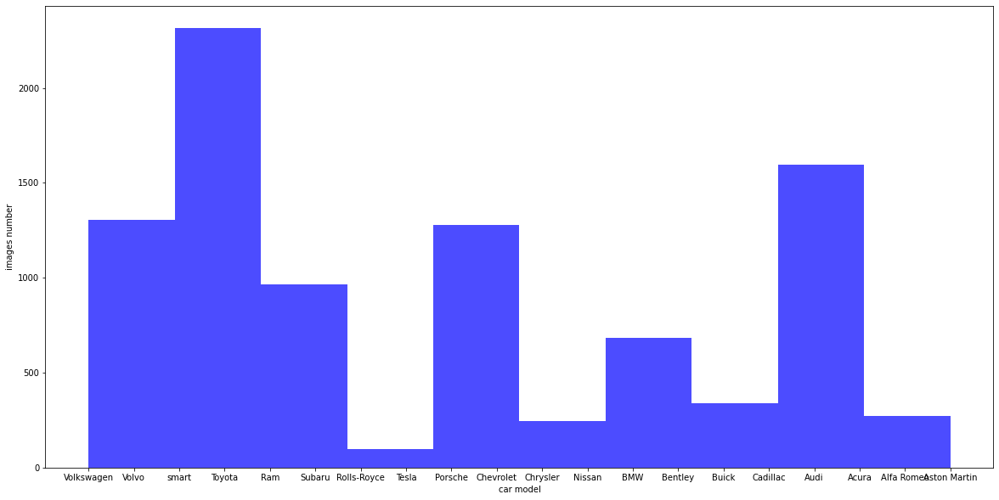

In [9]:
#히스토그램 그려서 모델에서 가장 많이 사용하는 자동차 패턴 무엇인지 파악
plt.figure(figsize=(20,10))
plt.hist(cars_model, color = "blue", lw=0, alpha=0.7)
plt.ylabel('images number')
plt.xlabel('car model')
plt.show()

In [10]:
#이미지와 품질 확인
#최소, 최대 크기 얻기 위해 전체 데이터 세트 검토 -> 계산 능력에 맞는 크기 선택 가능
image_size = []
for filename in cars_images_path:
    im=Image.open(filename)
    im =im.size
    image_size.append(im)
print(max(image_size))
print(min(image_size))

(320, 360)
(320, 124)


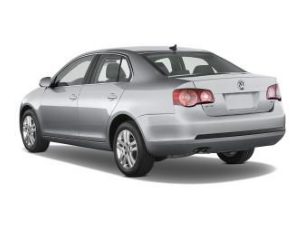

In [11]:
# Read in the image
image = mpimg.imread(cars_images_path[20])

plt.axis("off")
plt.imshow(image)

##### Let's take a look on the different channel axis views of the image (the red, green and blue channels)

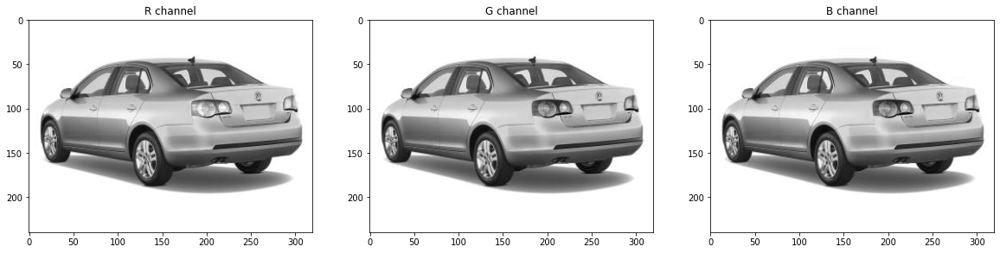

In [12]:
#이미지가 RGB인지 회색조인지 확인
#각각의 채널 분리하고 이미지 시각화
# Isolate RGB channels
r = image[:,:,0]
g = image[:,:,1]
b = image[:,:,2]

# Visualize the individual color channels
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
ax1.set_title('R channel')
ax1.imshow(r, cmap='gray')
ax2.set_title('G channel')
ax2.imshow(g, cmap='gray')
ax3.set_title('B channel')
ax3.imshow(b, cmap='gray')

세 이미지는 각각 다름
데이터 관점에서 보면 모델에게 입력값으로 제공되는 단일 이미지는 실제로 세 개의 이미지라는 것 의미

The dataset contains 8960 images:
* Three-channel each one.
* Diverse styles 
-> 이미지에 다양한 스타일이 있어 GAN이 붕괴되면 interface 단계에서 동일한 이미지가 생성됨
* the minimum shape is (320, 124)
* the maximum shape is (320, 360)

### Data Loader(데이터 전처리)

데이터 파이프라인

두가지 버전 존재. 
1. Tensorflow에서 제공하는 데이터 API 사용. 

데이터 세트 객체 생성하고 데이터 가져올 위치 지정한 다음 원하는 방식으로 변환 필요
이후에 Tensorflow가 멀티스레딩, 큐잉, 일괄처리, 프리패치 등과 같은 모든 구현 세부 정보 처리

2. PIL 사용해 이미지 읽고 크기 조정

- 시간 많이 걸림
- 이미지 크기 조정하며 이미지 품질 유지하는데 좋음
- `resize()` 함수는 사용된 이미지를 수정하지 않고 새 크기로 다른 이미지 반환하기 때문
- 이미지 보간은 Tensorflow보다 낮음


(1) Create dataset entirely in RAM using tf.data.Dataset.from_tensor_slices() \
(2) Call shuffle to ensure that the training set are independent and identically distributed. \
NB:  the buffer size must be specified, and it is important to make it large enough or else shuffling will not be very efficient.\
(3) Do the necessary transformation by calling the map() method. \
(4) Call the batch() method. It will group the items of the previous dataset in batches of n items. \
(5) Using prefetch will let the dataset work on parallel with training algorithm to get the next batch ready.
![alt text](https://drive.google.com/uc?export=view&id=1xe7O6sTg1HxbM_Fc8p57gGXB9keeaDjC)


생산 과정에서 때때로 품질을 희생하고 결과를 더 빨리 얻는 경향 있음
궁극적으로 모델을 조정하고 많은 경험을 적용해본 후 품질을 갖을 수 있기 때문

We must scale the pixel values from the range of unsigned integers in [0,255] to the normalized range of [-1,1] or [0,1]. But you should know that if you're using [-1,1] you need to choose tanh as an activation function and if you are normalizing to [0,1] you use sigmoid activation function.

### Data Loader using TF API

tf.Function: 훈련 가속화하기 위해 사용. 
- Tensorflow에서 정의된 함수 외부의 것에 대한 선언문 역할
- 이미지 읽기, 디코딩, 크기 조정 및 정규화에서 필요한 작업 수행


In [13]:
#tf.Fuction과 함께 제공되는 preprocessing_data 함수
@tf.function
def preprocessing_data(path):
    image = tf.io.read_file(path) #이미지 읽기
    image = tf.image.decode_jpeg(image, channels=3) #디코딩
    image = tf.image.resize(image, [IMAGE_SHAPE[0],IMAGE_SHAPE[1]]) #크기 조정
    #정규화: 항상 [0,255]의 부호 없는 정수 범위 내 [-1,1] 또는 [0,1]의 정규화된 범위로 픽셀 값 조정
    #[-1,1] 사용하는 경우 활성화 함수로 tanh를 선택, [0,1] 정규화의 경우 시그모이드 활성화 함수 사용
    image = image / 255.0 #[0,1]구간 선택, generator의 마지막 레이어에서 시그모이드 액티베이션 함수 사용
    return image

 tanh는 음수와 양수 값을 취하지만 각 음수의 시그모이드는 0이 되기 때문에 tanh가 더 적합하지만 일부 데이터에 몇가지 예외 존재해서 시그모이드 사용


    tf.data 

데이터 파이프라인 준비
미리 내장된 호출로 Tensorflow의 많은 ETL 프로세스 처리

    tf.data.Dataset.from_tensor_slices()

경로 입력해 RAM에 데이터 세트 만들기

    shuffle(버퍼크기)

훈련 세트가 독립적이고 동일하게 분산될 수 있도록 함
버퍼크기를 충분히 크게 지정하는 것이 중요

    map()

호출해 필요한 변환을 수행하면 이 함수가 `preprocessing_data()` 함수 실행

    이후 batch() 실행

이전 데이터 세트의 항목을 n개의 항목을 그룹화해 일괄 처리

    prepatch()

데이터세트가 훈련 알고리즘과 병렬으로 작동해 다음 배치 준비 가능

In [14]:
#tf.data 사용해 데이터 파이프라인 준비
#미리 내장된 호출로 Tensorflow의 많은 ETL 프로세스 처리
def dataloader(paths):
      
    dataset = tf.data.Dataset.from_tensor_slices(paths)
    
    dataset = dataset.shuffle(10* BATCH_SIZE)
    dataset = dataset.map(preprocessing_data)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(1)
    return dataset

프로세스가 잘 진행되고 있는지 확인하기 위해 `take()` 함수 사용해 데이터 세트에서 하나의 배치 시각화

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


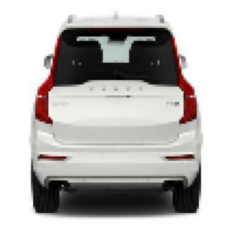

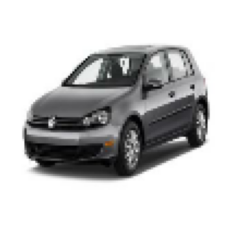

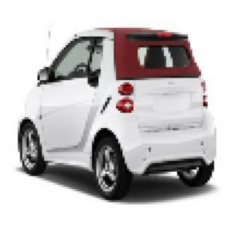

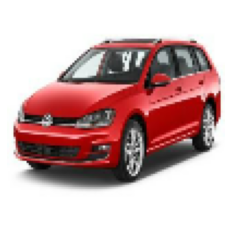

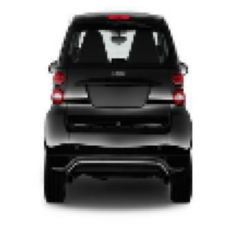

...

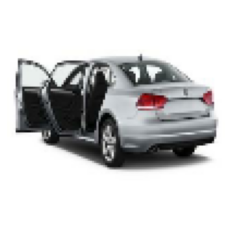

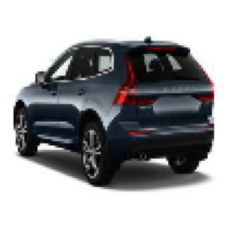

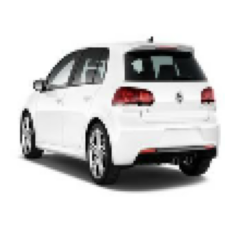

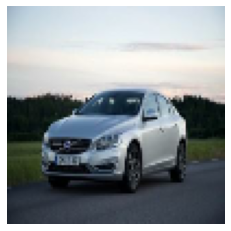

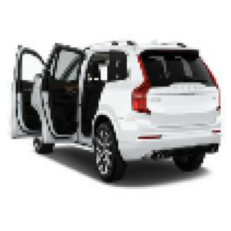

In [15]:
dataset = dataloader(cars_images_path)
for batch in dataset.take(1):
    for img in batch:
        img_np = img.numpy()
        plt.figure()
        plt.axis('off')
        #회색조 사용해 이미지 정규화
        plt.imshow((img_np-img_np.min())/(img_np.max()-img_np.min()))

### Data Loader using PIL

전처리가 `tf.function`과 `Tensorflow api`를 사용하지 않고 `PIL` 함수를 사용하는 것이 큰 차이 

In [16]:
image_list = []
for filename in cars_images_path:
    im=Image.open(filename)
    im =im.resize((IMAGE_SHAPE[0],IMAGE_SHAPE[1]))
    image_list.append(im)

In [17]:
images_processed = []
for image in image_list:
    gan_train_images = np.asarray(image)
    gan_train_images = gan_train_images.astype('float32') /255.0
    images_processed.append(gan_train_images)

`tf.data.from_tensor_slices()`를 사용해 동일한 작업을 수행하지만 전처리된 이미지를 입력하고 `map()`을 사용하지 않음

> 들여쓴 블록



데이터 세트 출력 확인
다른 데이터 파이프라인을 사용해 모델링할 때마다 실행하고 출력을 직접 판단 가능

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


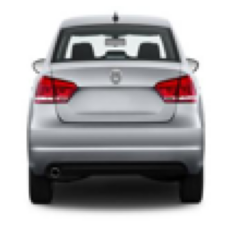

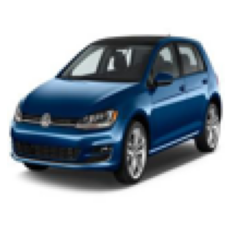

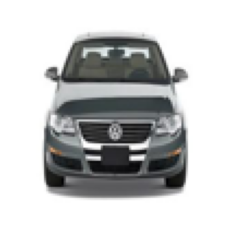

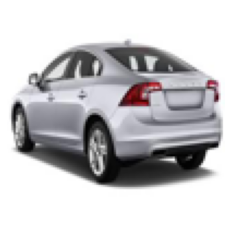

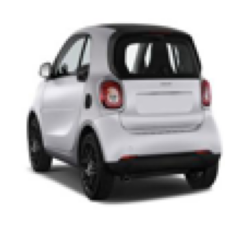

...

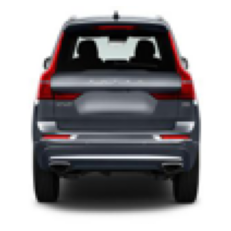

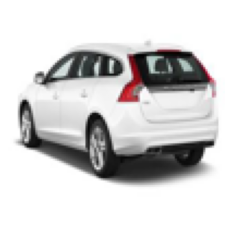

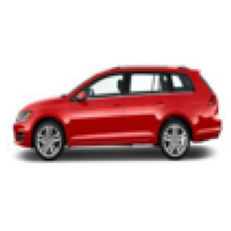

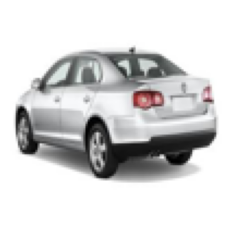

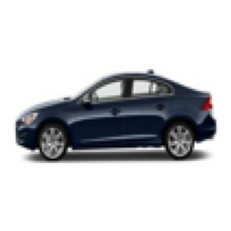

In [18]:
dataset = tf.data.Dataset.from_tensor_slices(images_processed).shuffle(10* BATCH_SIZE).batch(BATCH_SIZE)
for batch in dataset.take(1):
    for img in batch:
        img_np = img.numpy()
        plt.figure()
        plt.axis('off')
        plt.imshow((img_np-img_np.min())/(img_np.max()-img_np.min()))

# Modeling

모델에서 최상의 성능 얻기 위해 `DeepConvolutional GAN` 구현

`DCGAN`은 Discriminator로 컨볼루션 신경망을 사용하고 Generator는 전치된 컨볼루션으로 구성된 네트워크 사용하는 GAN

    DCGAN 구현
1. Generator
2. Discriminator
3. training procedure

지정 필요

    VainillaGAN vs DCGAN
  
`VanillaGAN`과 동일한 추론과 목적 함수 사용하는데 우리는 더 나은 결과를 얻기 위해 경로를 줄여야 함
본래 GAN 아키텍처를 `DCGAN`에 속하는 `CNN 아키텍처` 제품군으로 대체해 표준 GAN보다 더 나은 결과 얻고자 함

### Generator


![Generator.png](https://drive.google.com/uc?export=view&id=1R14EtpJXZo_kKWJSsUqUPPdLgZ_phMhV)

Generator 아키텍처 정의를 위해 `Sequential API` 사용

실제로 `tf.keras` 사용

    tf.keras.Sequential()tf.keras.Sequential()

Sequential 클래스의 인스턴스 생성하고 모델 레이어를 추가해 딥러닝 모델 생성
이후 Generator은 latent space에서 포인트를 가져와서 진짜같은 가짜 이미지 만듦

`가우시안 랜덤 벡터` 
균일 분포의 벡터 사용하는 것보다 나은 방법

출력은 데이터로더의 이미지 크기 조정이나 정규화에서 선택한 것처럼 [0,1]의 픽셀 값을 가진 100*100 픽셀의 2차원 정사각형 색상 이미지

아키텍처 단계
1. feature 해석을 돕기 위해 입력 벡터 z를 `fully connected layer`에 연결
- 매개 변수 입력에서 latent variable 형성
- 100개의 요소 벡터를 입력으로 사용하도록 선택
- 완전히 연결된 레이어 재구성하고 2D 이미지 `BatchNormailization` 및 `ReLu()` 활성화 함수 처리할 때 `ConvTranspose2D` 블록 계속 사용
2. 입력 데이터에 대해 선택한 것과 동일한 크기의 최종 이미지 크기 얻음

이미지를 0과 1 사이로 정규화했기 때문에 마지막 레이어 시그모이드 함수를 적용

In [19]:
def make_generator_model():
    model = tf.keras.Sequential() #Sequential 모델 API
    model.add(layers.Dense(25*25*128, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    model.add(layers.Reshape((25, 25, 128)))
    assert model.output_shape == (None, 25, 25, 128) # Note: None is the batch size

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    assert model.output_shape == (None, 25, 25, 128)
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 50, 50, 64)
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    
    model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='sigmoid'))
    assert model.output_shape == (None, 100, 100, 3)
    model.summary()
    return model

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 80000)             8000000   
_________________________________________________________________
batch_normalization (BatchNo (None, 80000)             320000    
_________________________________________________________________
re_lu (ReLU)                 (None, 80000)             0         
_________________________________________________________________
reshape (Reshape)            (None, 25, 25, 128)       0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 25, 25, 128)       409600    
_________________________________________________________________
batch_normalization_1 (Batch (None, 25, 25, 128)       512       
_________________________________________________________________
re_lu_1 (ReLU)               (None, 25, 25, 128)       0

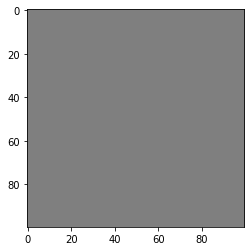

In [20]:
generator = make_generator_model()
noise = tf.random.normal([1, LATENT_DEPTH])
generated_image = generator(noise, training=True)

plt.imshow(generated_image[0, :, :, :], cmap='gray')

### Discriminator

`DCGAN`의 CNN계열은 두 가지 유형의 계층으로 구성
1. Convolutional Layer
2. Transposed Convolutional Layer


discriminator 네트워크는 데이터 세트에서 샘플 이미지를 입력으로 가져와 샘플이 실제인지 가짜인지 분류 예측 출력 필요

때문에 3개의 색상 채널과 크기가 100*100 픽셀인 이미지를 입력으로 사용하고 이진 교차 엔트로피 손실 함수를 사용해 이진 분류를 출력함
Generator와 마찬가지로 `Sequential API `사용

Discriminator에는 전치된 컨볼루션 레이어 대신 컨볼루션 레이어 사용


![Discriminator.png](https://drive.google.com/uc?export=view&id=1AUwLeBvtGLnnoMx6m-xXi9Aq4LuQjaOp)

`첫번째 레이어`
1. 입력 모양 지정 `Conv2D`
2. 활성화함수로 블록 `ReLU` 계속 사용하고 오버피팅을 줄이기 위한 regularization기술로 `Dropout` 계속 진행

이 기술은 discriminator에게 최선의 학습방법
또한 모든 단위의 수신 및 발신 연결과 함께 네트워크 단위, 인공 뉴런 단위를 일시적으로 삭제

주어진 유닛을 유지하고 떨어뜨리지 않을 확률인 `keep_prob`가 0.3이므로 `layers.Dropout(0.3)`으로 선언

3. `flatten` 함수 사용해 주어진 array가 1차원으로 붕괴된 마지막 레이어 출력과 조밀한 레이어의 복사본을 가져와 입력 이미지의 실제 또는 가짜에 대한 최종 출력 예측 얻음

In [21]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[100, 100, 3]))
    model.add(layers.ReLU(0.2))
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.ReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))
    model.summary()
    return model

discriminator 입력은 3개의 채널을 가진 100*100 크기의 이미지이며 예측 출력

In [22]:
discriminator = make_discriminator_model()
decision = discriminator(generated_image)
print (decision)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 50, 50, 64)        4864      
_________________________________________________________________
re_lu_3 (ReLU)               (None, 50, 50, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 50, 50, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 25, 25, 128)       204928    
_________________________________________________________________
re_lu_4 (ReLU)               (None, 25, 25, 128)       0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 25, 25, 128)       0         
_________________________________________________________________
flatten (Flatten)            (None, 80000)            

`tf.Tensor([[0.16242419]], shape=(1, 1), dtype=float32)`

0에 가까운 값이 출력되므로 generator에서 생성한 이미지를 가짜라고 평가

Nash equillibrium 상태 얻을 때까지 모델 품질 평가에 중요한 객관적인 함수

`minmax game` 최적화 위해 Generator 목표를 달성하기 위한 경사 하강 단계와 Discriminator의 목표를 달성하기 위한 경사 상승 단계 번갈아 수행

Generator 업데이트해 Discriminator가 올바른 선택할 가능성 최소화해야하지만 생각보다 구현이 잘 되지 않기 때문에 이 방법 대신 discriminator가 잘못된 선택을 할 가능성 최대화

이 방법은 `Generator gradient vanishing` 완화에 도움 즉
discriminator가 실제와 가짜를 구분하지 못하도록 하는데 도움

## Loss and Optimization

    Adam 알고리즘: 고급 경사 하강법 기반 최적화 프로그램


In [23]:
generator_optimizer = tf.keras.optimizers.Adam(lr=LR)
discriminator_optimizer = tf.keras.optimizers.Adam(lr=LR)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


    최소화하기 위해서 이진 교차 엔트로피 사용

`이진 교차 엔트로피`는 둘 중 하나만 고르는 것으로 계산된 확률과 실제 확률간 차이 측정

In [24]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

discriminator는 두 번 훈련

실제 이미지와 가짜 이미지가 한번씩 주어짐

`tf.ones_like` 함수 통해 모델에게 이것이 실제 데이터라는 것을 알리고 가짜에 대해 `tf.zeros_like` 사용해 discriminator 속임

In [25]:
def discriminator_loss(real_output, fake_output):
    r_loss = cross_entropy(tf.ones_like(real_output), real_output)
    f_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    loss_total = r_loss + f_loss
    return loss_total

In [26]:
def generator_loss(fake_output):
    f_loss = cross_entropy(tf.ones_like(fake_output), fake_output)
    return f_loss

The model is trained to minimize [MeanSquaredError](https://rohanvarma.me/Loss-Functions/)

In [27]:
mse = tf.losses.MeanSquaredError()

In [28]:
def discriminator_loss(r_logit, f_logit):
    r_loss = mse(tf.ones_like(r_logit), r_logit)
    f_loss = mse(tf.zeros_like(f_logit), f_logit)
    loss_total = r_loss + f_loss
    return loss_total

In [29]:
def generator_loss(f_logit):
    f_loss = mse(tf.ones_like(f_logit), f_logit)
    return f_loss

## Experiment utils (RUN ME)

    필요한 3가지 출력

1. 실험을 평가하고 손실을 평가하기 위한 텐서보드 로그 `tf.summary`


In [30]:
def summary(name_data_dict,
            step=None,
            types=['mean', 'std', 'max', 'min', 'sparsity', 'histogram'],
            historgram_buckets=None,
            name='summary'):
    """Summary.
    Examples
    --------
    >>> summary({'a': data_a, 'b': data_b})
    """
    def _summary(name, data):
        ##tf.summary.trace_on(graph=False, profiler=True)
        if data.shape == ():
            tf.summary.scalar(name, data, step=step)
            ##tf.summary.trace_export(
              ##name="trace",
              ##step=0,
              ##profiler_outdir=MODEL_SAVE_PATH
            ##)
        else:
            if 'mean' in types:
                tf.summary.scalar(name + '-mean', tf.math.reduce_mean(data), step=step)
            if 'std' in types:
                tf.summary.scalar(name + '-std', tf.math.reduce_std(data), step=step)
            if 'max' in types:
                tf.summary.scalar(name + '-max', tf.math.reduce_max(data), step=step)
            if 'min' in types:
                tf.summary.scalar(name + '-min', tf.math.reduce_min(data), step=step)
            if 'sparsity' in types:
                tf.summary.scalar(name + '-sparsity', tf.math.zero_fraction(data), step=step)
            if 'histogram' in types:
                tf.summary.histogram(name, data, step=step, buckets=historgram_buckets)
           ## tf.summary.trace_export(
            ##  name="trace",
             ## step=0,
             ## profiler_outdir=MODEL_SAVE_PATH
            ##)
    with tf.name_scope(name):
        for name, data in name_data_dict.items():
            _summary(name, data)

2. Generator 및 Discriminator 모델의 모델 체크포인트 필요

훈련 중에 어떤 일이 발생하더라도 훈련 재개할 수 있도록 함하고 여러 interface 사용해 새 자동차 이미지를 생성할 수 있는 weight 학습한 generator 사용할 수 있음

`log directory`에 대한 `summary file write` 만들기

`tf.train.Checkpoint` 함수 사용해 추적 가능한 상태의 두 개체 즉 최적화 프로그램과 두 네트워크를 관리할 체크 포인트 만들기


In [31]:
train_summary_writer = tf.summary.create_file_writer(os.path.join(EXPERIMENT_ID, 'summaries', 'train'))
checkpoint_prefix = os.path.join(CHECKPOINT_DIR, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

15 epoch마다 호출되고 반복해서 generator가 생성한 이미지 그리드를 출력하는 `generate_and_save_images()` 함수 추가

```
# 코드로 형식 지정됨
```



In [32]:
def generate_and_save_images(model, epoch):
    
    plt.figure(figsize=(15,10))

    for i in range(4):
        noise = tf.random.normal([1,100]) - 1 + (i * 0.2) + 0.1 
        images = model(noise, training=False)
        
        image = images[0, :, :, :]
        image = np.reshape(image, [100, 100, 3])

        plt.subplot(1, 4, i+1)
        plt.imshow(image, cmap='gray')
        plt.axis('off')
        plt.title("Randomly Generated Images")

    plt.tight_layout()  
    plt.savefig(os.path.join(MODEL_SAVE_PATH,'image_at_epoch_{:02d}.png'.format(epoch)))
    plt.show()

## Training Process

    DCGAN 훈련은 Vanilla GAN 훈련과 유사한 4단계 프로세스

1. 가우시안 분포 사용해 랜덤 벡터 초기화

역전파 프로세스에 유용한 `tf.GradeintTape` 사용

이 함수가 모든 그라디언트 단계를 기록하고 필요할 때 다시 실행하기 때문에 단계가 저장되고 다시 구현하는 시간이 절약
2. Discriminator 네트워크 훈련
 
Generator는 가짜 이미지 생성하고 Discriminator는 한 번 실제 이미지를 입력으로 받고 한번 가짜 이미지를 입려으로 받아 피드백 제공해 discriminator_loss 함수 loss에 대한 입력으로 제공됨

3. Generator 네트워크 훈련

가짜 이미지에 대한 discriminator 피드백 받아 generator_loss에 대한 입력으로 제공

그라디언트 계산 후 optimize에 이를 적용하도록 요청

4. `loss dictionary` 얻음 


In [33]:
# Notice the use of `tf.function`
# This annotation causes the function to be "compiled".
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, LATENT_DEPTH])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    return {'Generator loss': gen_loss,
            'Discriminator loss': disc_loss}

    트레이닝
- `tensorboard writer` 호출하고 각 epoch마다 호출
- 루프로 전체 데이터 세트 호출
- 이미지 배치 가져오기
- GAN 학습
- `summary function`에 대한 `loss directory` 제공하고 이미지와 체크 포인트 저장


In [49]:
def train(dataset, epochs):
    tf.summary.trace_on(graph=False, profiler=True)
    with train_summary_writer.as_default():
        with tf.summary.record_if(True):
            for epoch in range(epochs):
                start = time.time()
                for image_batch in dataset:
                    loss_dict = train_step(image_batch)
                summary(loss_dict, step=generator_optimizer.iterations, name='losses')

           ##display.clear_output(wait=True)
             ## generate_and_save_images(generator,
                                    ## epoch + 1)
                # Save the model every 15 epochs
                if (epoch + 1) % 15 == 0:
                    checkpoint.save(file_prefix = checkpoint_prefix)
                    display.clear_output(wait=True)
                    generate_and_save_images(generator,
                                     epoch + 1)
                print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))


    # Generate after the final epoch
    display.clear_output(wait=True)
    generate_and_save_images(generator, epochs)

In [57]:
%tensorboard --logdir '/content/drive/My Drive/lecture hands on lab/LSGAN/results/training_checkpoints'

<IPython.core.display.Javascript object>

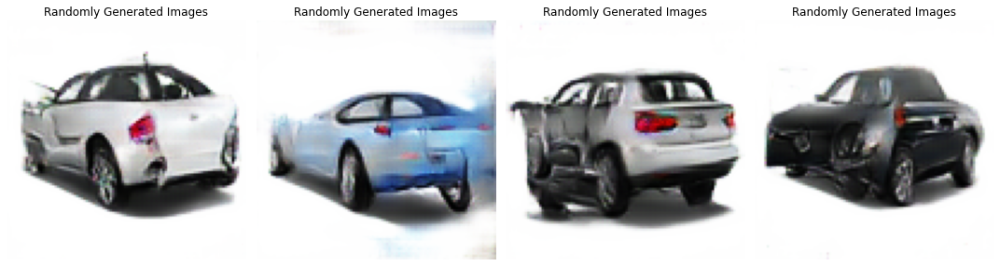

Time for epoch 506 is 15.769650936126709 sec


In [ ]:
train(dataset, EPOCHS)

### Generate Gif with the whole generated images during training

In [ ]:
anim_file = 'dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob('image*.png')
    filenames = sorted(filenames)
    last = -1
    for i,filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

import IPython
if IPython.version_info > (6,2,0,''):
    display.Image(filename=anim_file)

# Congratulations!
you have built your first Least Square GAN

### Suggestion tasks for practice

* Play arround with the model architecture
* Play arround with optimizer
* Tuning the hyperparameters
  - Learning rate
  - Batch size
  - Number of epochs
  - Generator optimizer
  - Discriminator optimizer
  - Number of layers
  - Number of units in a dense layer
  - Activation function
* Observe the discriminator and generator loss failure and image generation failure using tensorboard
* See this [github](https://github.com/soumith/ganhacks) repo that contains a set of 17 hacks that are useful for getting models working
* Try [hinge loss](https://rohanvarma.me/Loss-Functions/)

In [ ]:
## Solution for hinge loss
def discriminator_loss(r_logit, f_logit):
    r_loss = tf.reduce_mean(tf.maximum(1 - r_logit, 0))
    f_loss = tf.reduce_mean(tf.maximum(1 + f_logit, 0))
    return r_loss, f_loss

def generator_loss(f_logit):
    f_loss = tf.reduce_mean(- f_logit)
    return f_loss